## Project Description: 

This project is part of a broader use case involving a company that provides Reinforcement Learning from Human Feedback (RLHF) services. RLHF is a technique commonly used to fine-tune Large Language Models (LLMs) by incorporating human feedback to train, evaluate, and enhance the models' safety and usefulness. In this scenario, the company acts as an RLHF service provider, recruiting workers to its platform to carry out RLHF tasks on behalf of its clients.

The purpose of this exercise is to estimate workers' lifetime value. Consider these workers as skilled freelance employees who often work sporadically on projects posted to the platform. Much like more conventional applications of CLTV models, where non-subscription retail customers come and go with no long-term commitments, estimating the long-term value of a worker can be difficult given the uncertainty of future engagement. 

Through this exercise, we aim to garner key insights into: 

**Predicting Future Engagement:** Assess the likelihood of future engagement across the workforce to enable more effective planning and execution of acquisition strategies that align with the platform’s future needs.

**Worker Churn and Re-engagement:** Identify which workers have stopped participating or are at risk of churning. This enables targeted outreach through email, SMS, or digital advertising to encourage their return.

**Worker Prioritization and Segmentation:** Use estimated lifetime value as a key metric to segment and prioritize workers. This allows for more strategic and personalized engagement efforts based on potential long-term contribution.

**Active Worker Output and User Acquisition:** Analyze the expected work output of currently active workers over a given time period. These insights help guide user acquisition strategies, ensuring the platform maintains a sufficient and balanced supply of available workers to meet ongoing demand.

## Methodology: 

Estimating the Lifetime Value of RLHF workers will consist of two primary components: predicting future engagement and estimating future earnings.

### Predicting Worker Engagement: 

To predict the probability of future re-engagement, we will leverage Buy 'til You Die (BTYD) models. These models utilize a worker's recency of last engagement and the frequency of repeat sessions to fit curves describing session frequency distribution and engagement drop-off. We will evaluate and compare two popular models, the **Beta-Geometric/Negative Binomial Distribution (BG/NBD)** and the **Pareto/Negative Binomial Distribution (Pareto/NBD).** For this project, we will be estimating worker sessions in place of customer purchases. 

### Estimating Future Earnings: 

As a complement to our BTYD model, we will develop a **Gamma-Gamma model** to estimate the average monetary value of worker sessions on the platform. The output of this model, when combined with the predicted future session frequency from the BTYD model, will culminate in our worker lifetime value predictions over a future period. In this context, earnings will serve as the proxy for purchase value. Earnings are variable, as they are influenced by task rates (urgency, complexity, and required expertise) and session duration. We assume the business makes a percentage of the total revenue (rate * minutes_worked/60), in which case earnings is a comparable proxy to order value. 

In [1]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px
from hyperopt import hp, tpe, fmin, Trials, space_eval, STATUS_OK
import matplotlib.pyplot as plt

from lifetimes import BetaGeoFitter, GammaGammaFitter, ParetoNBDFitter
from lifetimes.utils import calibration_and_holdout_data, summary_data_from_transaction_data
from lifetimes.utils import summary_data_from_transaction_data
from lifetimes.plotting import plot_frequency_recency_matrix, plot_probability_alive_matrix

import warnings
warnings.filterwarnings("ignore")

In [2]:
df = pd.read_csv("rlhf_work_sessions.csv")
df["date"] = pd.to_datetime(df["date"])

## Exploratory Data Analysis:

Our sample dataset is comprised of **364,869** unique observations between **January 1, 2024 - December 31, 2024**. Each row represents a distinct working session on the platform, with the following columns: 

**user_id:** Unique identifier for each worker

**date:** The date of the user's work activity 

**minutes_worked:** Total minutes logged for that session

**earnings:** Total user earnings for the work completed

In total, the dataset includes **62,032** unique users, accounting for approximately **37.6 million** total minutes worked and around **$31.3 million** in total earnings.



In [3]:
df.head()

,user_id,date,minutes_worked,earnings
0,a19e2720a4f6afec17b58c841220010b,2024-01-01,53,44.65
1,6574c3b5ef34363e0b68d314aad0cc1c,2024-01-01,16,13.34
2,a481dedc3684332d7aa696d950a8cc96,2024-01-01,160,142.05
3,eaf8ba3c7d37248ee421920a7d61dd78,2024-01-01,162,145.40
4,70e47429834e14f9ed5ee1e99e3a3082,2024-01-01,39,33.58


In [4]:
record_volume = len(df)
n_users = df['user_id'].nunique()
total_min_worked = df['minutes_worked'].sum()
earnings = round(df['earnings'].sum(),2)
date_start = df['date'].min()
date_end = df['date'].max()

print(f" Records: {record_volume} \n Users: {n_users} \n Total Minutes Worked: {total_min_worked} \n Earnings: {earnings} \n Date Range: {date_start} - {date_end}")

 Records: 364869 
 Users: 62032 
 Total Minutes Worked: 37591734 
 Earnings: 31328116.3 
 Date Range: 2024-01-01 00:00:00 - 2024-12-31 00:00:00


In [5]:
daily_records = df.groupby("date").size().reset_index(name='n_records')

records_daily_plot = px.line(daily_records, x="date", y="n_records")

records_daily_plot.update_layout(
    title=dict(
        text= "RLHF Worker Sessions: Jan - Dec 2024",
        y=0.95,
        x=0.5,
        xanchor= 'center',
        yanchor= 'top'),
    yaxis_title_text="Session Volume",
    xaxis_title_text=""
)
records_daily_plot.show()

The daily session totals show a non-linear upward trend, starting at around 700 sessions in January and rising to approximately 2,200 by the end of the year. There are also noticeable seasonal effects, such as a drop-off in activity around Christmas followed by a resurgence in the final week of the year. External factors, like marketing spend, could be influencing the ramp up observed through Q4 2024. 

### Earnings & Minutes Worked: 



Earnings per session appear to be approximately normally distributed, with a mean of 85.86 and a median of 84.77. Both the summary statistics and the histogram suggest that most workers earn between 60-110 per session. Similarly, minutes worked per session also follow an approximately normal distribution, with a mean of 103.03 minutes and a median of 103 minutes. From this, we can infer that the average worker typically spends around 1-2 hours on the platform during each working session.



In [6]:
#Earnings Summary Stats
earnings_ss = pd.DataFrame(df['earnings'].describe())
earnings_ss_table = earnings_ss.iloc[1:].T
earnings_ss_table['mean'] = round(earnings_ss_table['mean'], 2)
earnings_ss_table['std'] = round(earnings_ss_table['std'], 2)

#Minutes Worked Summary Stats
min_worked_ss = pd.DataFrame(df['minutes_worked'].describe())
min_worked_ss_table = min_worked_ss.iloc[1:].T
min_worked_ss_table['mean'] = round(min_worked_ss_table['mean'], 2)
min_worked_ss_table['std'] = round(min_worked_ss_table['std'], 2)


#Combined Fig
fig = make_subplots(rows=2, cols=2,
                    specs=[[{'type': 'xy'},    {'type': 'xy'}],
                           [{'type': 'table'}, {'type': 'table'}]],
                    row_heights=[0.80, 0.20],
                    vertical_spacing=0.13,
                    horizontal_spacing=0.075,
                    subplot_titles=('Histogram of Earnings', 'Histogram of Minutes Worked'))

# Earnings histogram
fig.add_trace(go.Histogram(x=df['earnings'], nbinsx=30, marker_color=("#00B3A4"), opacity = 0.8, name='Earnings'), row=1, col=1)

#Earnings Summary Stats
fig.add_trace(go.Table(
    header=dict(values=list(earnings_ss_table.columns),
                align='center'),
    cells=dict(values=[earnings_ss_table[col].tolist() for col in earnings_ss_table.columns],
               align='center')), row=2, col=1)

# Minutes Worked histogram
fig.add_trace(go.Histogram(x=df['minutes_worked'], nbinsx=30, marker_color=("#03316d"), opacity = 0.8, name='Minutes Worked'), row=1, col=2)

# Minutes Worked Summary Stats
fig.add_trace(go.Table(
    header=dict(values=list(min_worked_ss_table.columns),
                align='center'),
    cells=dict(values=[min_worked_ss_table[col].tolist() for col in min_worked_ss_table.columns],
               align='center')), row=2, col=2)

#Add Axis Labels
fig.update_xaxes(title_text="Earnings", row=1, col=1)
fig.update_yaxes(title_text="Frequency", row=1, col=1)
fig.update_xaxes(title_text="Minutes Worked", row=1, col=2)
fig.update_yaxes(title_text="Frequency", row=1, col=2)

fig.update_layout(
    bargap=0.1,
    height=700,
    showlegend=False)

fig.show()

Next, we'll summarize our data by user_id to get a better understanding of some of the features we'll be using to train our models.



In [7]:
# Pivot DF by User ID & Calculate Summary Statistics 

users_eda_stats = df.groupby('user_id').agg(
    work_sessions=('date', 'nunique'),  # Count distinct dates
    avg_min_worked=('minutes_worked', 'mean'),  # Average of minutes_worked
    avg_earnings=('earnings', 'mean'),  # Average of earnings
    min_date=('date', 'min'),  # Minimum date
    max_date=('date', 'max')   # Maximum date
).reset_index()

# total_days_on_platform
users_eda_stats['total_days_on_platform'] = (users_eda_stats['max_date'] - users_eda_stats['min_date']).dt.days + 1

# avg_days_freq
users_eda_stats['avg_days_freq'] = users_eda_stats['total_days_on_platform'] / users_eda_stats['work_sessions']

users_eda_stats.describe()

,work_sessions,avg_min_worked,avg_earnings,min_date,max_date,total_days_on_platform,avg_days_freq
count,62032.000000,62032.000000,62032.000000,62032,62032,62032.000000,62032.000000
mean,5.881948,103.112039,85.935269,2024-05-30 23:33:00.139283200,2024-08-16 12:59:32.607686400,78.560098,11.755795
min,1.000000,15.000000,9.770000,2024-01-01 00:00:00,2024-01-01 00:00:00,1.000000,1.000000
25%,2.000000,73.000000,60.887977,2024-02-08 00:00:00,2024-05-10 00:00:00,14.000000,3.812500
50%,4.000000,103.000000,85.240000,2024-05-27 00:00:00,2024-09-03 00:00:00,49.000000,10.750000
75%,8.000000,132.000000,110.323375,2024-09-07 00:00:00,2024-12-12 00:00:00,115.000000,17.500000
max,69.000000,251.000000,223.820000,2024-12-31 00:00:00,2024-12-31 00:00:00,365.000000,79.750000
std,5.816625,41.383958,34.983598,NaN,NaN,85.523709,9.167475


### Session Volume: 

The average session volume is approximately 5.9 sessions per user, with a median of 4 sessions. However, the histogram reveals that the distribution follows a negative binomial pattern. This is critical, as it supports the assumptions underlying our proposed models for estimating worker session frequency.

In [8]:
#Worker Sessions Summary Stats
sessions_ss = pd.DataFrame(users_eda_stats['work_sessions'].describe())
sessions_ss_table = sessions_ss.iloc[1:].T
sessions_ss_table['mean'] = round(sessions_ss_table['mean'], 2)
sessions_ss_table['std'] = round(sessions_ss_table['std'], 2)

session_volume_plot = make_subplots(rows=2, cols=1,
                    specs=[[{'type': 'xy'}],
                           [{'type': 'table'}]],
                    row_heights=[0.80, 0.20],
                    vertical_spacing=0.1,
                    subplot_titles=('Worker Session Volume Histogram', "")
                   )

# Session Volume histogram
session_volume_plot.add_trace(go.Histogram(x=users_eda_stats['work_sessions'], opacity = 0.8, name="Session Volume"), row=1, col=1)

#Summary Stat Table
session_volume_plot.add_trace(go.Table(
    header=dict(values=list(sessions_ss_table.columns),
                align='center'),
    cells=dict(values=[sessions_ss_table[col].tolist() for col in sessions_ss_table.columns],
               align='center')), row=2, col=1)

#Add Axis Labels
session_volume_plot.update_xaxes(title_text="Session Volume", row=1, col=1)
session_volume_plot.update_yaxes(title_text="Frequency", row=1, col=1)

session_volume_plot.update_layout(
    bargap=0.1,
    height=700,
    showlegend=False)

session_volume_plot.show()

### Work Frequency: 



The average time between sessions is approximately 11.75 days, with a median of 10.75 days. As shown in the histogram to the left, and supported by the difference between the mean and median, the distribution is right-skewed. The cumulative frequency distribution on the right shows that approximately 36% of workers return within 7 days, ~65% within 14 days, and ~96% return within 30 days. While longer gaps between sessions do occur, they are relatively uncommon. This pattern is particularly important for our BYTD models, as the time since a worker's last session plays a key role in predicting their likelihood of returning. The probability of return decreases the longer it has been since the customer’s last session.

In [9]:
# Work Freq Summary Stats
freq_ss = pd.DataFrame(users_eda_stats['avg_days_freq'].describe())
freq_ss_table = freq_ss.iloc[1:].T
freq_ss_table['mean'] = round(freq_ss_table['mean'], 2)
freq_ss_table['std'] = round(freq_ss_table['std'], 2)

freq_plot = make_subplots(rows=2, cols=2,
                    specs=[[{'type': 'xy'}, {'type': 'xy'}],
                           [{'type': 'table', 'colspan': 2}, None]],
                    row_heights=[0.80, 0.20],
                    vertical_spacing=0.1,
                    subplot_titles=('Histogram: Worker Session Frequency (Days)', 'Cumulative Distribution: Worker Session Frequency (Days)')
                   )

# Session Frequency histogram
freq_plot.add_trace(go.Histogram(x=users_eda_stats['avg_days_freq'], nbinsx=30, opacity=0.8, name="Frequency (Days)"), row=1, col=1)

# ECDF plot
# Get the ECDF data
ecdf = px.ecdf(users_eda_stats['avg_days_freq']).data[0]
freq_plot.add_trace(go.Scatter(x=ecdf.x, y=ecdf.y, mode='lines', name='ECDF'), row=1, col=2)

# Add vertical line - 7 Day
freq_plot.add_shape(type="line", 
    x0=7, x1=7, 
    y0=0, y1=1, 
    line=dict(dash="dash", color="gray"),
    row=1, col=2
)

# Add vertical line - 14 Day
freq_plot.add_shape(type="line", 
    x0=14, x1=14, 
    y0=0, y1=1, 
    line=dict(dash="dash", color="gray"),
    row=1, col=2
)

# Add vertical line - 21 Day
freq_plot.add_shape(type="line", 
    x0=21, x1=21, 
    y0=0, y1=1, 
    line=dict(dash="dash", color="gray"),
    row=1, col=2
)

# Add vertical line - 30 Day
freq_plot.add_shape(type="line", 
    x0=30, x1=30, 
    y0=0, y1=1, 
    line=dict(dash="dash", color="gray"),
    row=1, col=2
)

# Add annotation for the vertical lines
freq_plot.add_annotation(x=7, y=1.03, text="7", showarrow=False, row=1, col=2)
freq_plot.add_annotation(x=14, y=1.03, text="14", showarrow=False, row=1, col=2)
freq_plot.add_annotation(x=21, y=1.03, text="21", showarrow=False, row=1, col=2)
freq_plot.add_annotation(x=30, y=1.03, text="30", showarrow=False, row=1, col=2)

# Summary Stat Table
freq_plot.add_trace(go.Table(
    header=dict(values=list(freq_ss_table.columns),
                align='center',
                font=dict(size=11),
                height=25),
    cells=dict(values=[freq_ss_table[col].tolist() for col in freq_ss_table.columns],
               align='center',
               font=dict(size=10),
               height=20)), 
    row=2, col=1)

# Add Axis Labels
freq_plot.update_xaxes(title_text="Session Frequency (Days)", row=1, col=1)
freq_plot.update_yaxes(title_text="Frequency", row=1, col=1)
freq_plot.update_xaxes(title_text="Session Frequency (Days)", row=1, col=2)
freq_plot.update_yaxes(title_text="Cumulative % of Total Workers", row=1, col=2)

freq_plot.update_layout(
    bargap=0.1,
    height=700,
    margin=dict(l=50, r=50, t=80, b=10),
    showlegend=False)

freq_plot.show()

## Data Preparation: 

The models require that our data be in a specific format, so we'll need to generate per-customer metrics of frequency, age (T),recency, and monetary value metrics:

**Frequency** - the number of dates on which a worker logged a working session after the date of the worker's first working session.

**Age (T)** - the number of time units, e.g. days, since the date of a workers's first session to the current date (or last date in the dataset).

**Recency** - the age of the worker (as previously defined) at the time of their last session.

**Monetary Value** - the average earnings per working session (excluding the first session)

Fortunately, _lifetimes_ provides a convenient utility that transforms our transaction data and handles the calculations for us. To support model validation and avoid overfitting, a common pattern with time series data is to train models on an earlier portion of the time series (known as the calibration period) and validate against a later portion of the time series (known as the holdout period). In the _lifetimes_ library, the derivation of per customer metrics using calibration and holdout periods is done through a simple method call. 

We will segment our data set into a 9 month (Jan.-Sept.) calibration period, and a 3-month (Oct.-Dec.) holdout period. 



In [10]:
# Set latest date
latest_date = df["date"].max()

# Lifetimes data transformation utility
summary = summary_data_from_transaction_data(
    df, 
    customer_id_col = "user_id", 
    datetime_col = "date", 
    observation_period_end = latest_date, 
    freq = 'D', 
    monetary_value_col = "earnings"
    )

# Exclude users who did not return
summary = summary[summary["frequency"] > 0]

In [11]:
# Lifetimes calibration / holdout split utility
cal_period_end = "2024-09-30"

df_holdout = calibration_and_holdout_data(
    df, 
    customer_id_col = "user_id", 
    datetime_col = "date", 
    calibration_period_end = cal_period_end, 
    observation_period_end = latest_date, 
    freq='D', 
    monetary_value_col = "earnings"
)

In [12]:
df_holdout.head()

,frequency_cal,recency_cal,T_cal,monetary_value_cal,frequency_holdout,monetary_value_holdout,duration_holdout
user_id,,,,,,,
0000465ac03d51485b12214544c577d7,3.0,48.0,53.0,29.420000,6.0,29.87,92.0
0000babee311cb54247218c8c2453605,1.0,45.0,263.0,115.210000,0.0,0.00,92.0
0000bb03651ba6af0e9902a5e62ec90c,10.0,130.0,271.0,139.713000,0.0,0.00,92.0
00023dd9c33c04738378bb8a84f33cfb,4.0,144.0,149.0,106.745000,0.0,0.00,92.0
000351d299539aaae2620c16bd95f61a,11.0,209.0,272.0,19.601818,0.0,0.00,92.0


## Worker Engagement Model:

To estimate future work engagements, we'll evaluate the **Beta-Geometric/Negative Binomial Distribution (BG/NBD)** and the **Pareto/Negative Binomial Distribution (Pareto/NBD)**.

Both models effectively capture the stochastic nature of customer transactions but differ in their approach to customer inactivity. The BG/NBD model assumes that while a customer is active, their transactions follow a Poisson process with a transaction rate λ. After any transaction, a customer becomes inactive with a probability p. The heterogeneity in λ across customers follows a Gamma distribution, while the heterogeneity in p follows a Beta distribution. Importantly, in the BG/NBD model, customer dropout occurs in "transaction time," meaning after a purchase.

In contrast, the Pareto/NBD model assumes that customers have an unobserved period of "being alive," after which they become permanently inactive. While alive, their transactions also follow a Poisson process with a rate λ. The active lifetime is assumed to be exponentially distributed with a dropout rate μ. The heterogeneity in both λ and μ across customers follows Gamma distributions. Unlike the BG/NBD model, dropout in the Pareto/NBD model occurs in "calendar time," independent of purchase events.

The BG/NBD model is popular for its relative simplicity in implementation and parameter estimation. It tends to perform well in scenarios where the time between purchases is relatively consistent for individual customers, and the "after-purchase" dropout mechanism is a reasonable approximation of reality.

The Pareto/NBD model is considered more theoretically grounded in modeling the continuous nature of customer attrition in calendar time. It can sometimes outperform the BG/NBD, especially in situations where the time of dropout is less tied to the number of transactions and more to external factors or a natural customer lifecycle. However, its parameter estimation can be more complex than the BG/NBD model.



### Initial Model Development: 

We'll use the calibration/holdout dataset constructed in the last section of this notebook, fitting both models to the calibration data and later evaluating them using the holdout data. 



In [13]:
#Beta-Geometric/NBD Model
bgf = BetaGeoFitter(penalizer_coef=0.001)
bgf.fit(df_holdout['frequency_cal'], df_holdout['recency_cal'], df_holdout['T_cal'])

#Pareto/NBD Model 
pnbd = ParetoNBDFitter(penalizer_coef=0.001)
pnbd.fit(df_holdout['frequency_cal'], df_holdout['recency_cal'], df_holdout['T_cal'])

<lifetimes.ParetoNBDFitter: fitted with 50380 subjects, alpha: 90.96, beta: 605.61, r: 3.76, s: 4.39>

In [14]:
#Beta-Geometric/NBD
bgf_freq_holdout_predicted = bgf.predict(df_holdout["duration_holdout"], df_holdout["frequency_cal"], df_holdout["recency_cal"], df_holdout["T_cal"])
bgf_freq_holdout_actual = df_holdout["frequency_holdout"]

#Pareto/NBD
pnbd_freq_holdout_predicted = pnbd.predict(df_holdout["duration_holdout"], df_holdout["frequency_cal"], df_holdout["recency_cal"], df_holdout["T_cal"])
pnbd_freq_holdout_actual = df_holdout["frequency_holdout"]

### Initial Model Measures of Fit:



In [15]:
def model_score(actuals, predicted, kpi = 'rmse'):
    
    kpi = kpi.lower()

    # Mean Squared Error and Root Mean Squared Error
    if kpi == 'mse' or kpi == 'rmse':
        val = np.sum(np.square(actuals-predicted))/actuals.shape[0]
        if kpi == 'rmse':
            val = np.sqrt(val)
        
    elif kpi == 'mae':
        np.sum(np.abs(actuals-predicted))/actuals.shape[0]
    
    else:
        val = None
        
    return val

In [16]:
print('BG/NBD RMSE: {0}'.format(model_score(bgf_freq_holdout_actual, bgf_freq_holdout_predicted, 'rmse')))

BG/NBD RMSE: 2.1213593515638642


In [17]:
print('Pareto/NBD RMSE: {0}'.format(model_score(pnbd_freq_holdout_actual, pnbd_freq_holdout_predicted, 'rmse')))

Pareto/NBD RMSE: 2.2290171877916887


Initial results suggest that the BG/NBD model outperforms the Pareto/NBD model. However, it's important to acknowledge that we have set the L2-norm regularization parameter (penalizer coefficient) somewhat arbitrarily to the minimum recommended value in the _lifetimes_ documentation.

As part of our model development, we also seek to determine the optimal value for the regularization parameter. The recommended range for this parameter is between 0 and 1, so to efficiently navigate this search space, we will employ **hyperopt**, a hyperparameter optimization library. Hyperopt utilizes sophisticated optimization algorithms to systematically explore parameter combinations and identify the optimal settings that minimize our defined loss function. This approach will allow us to make more informed decisions about both the model selection and the regularization strength that best suits our data.

In [18]:
# Define search space
space = hp.choice('model_type',[
                  {'type':'Pareto/NBD', 'l2':hp.loguniform('pareto_nbd_l2', -5, 2)},
                  {'type':'BG/NBD', 'l2':hp.loguniform('bg_nbd_l2', -5, 2)}
                  ]
                )


def model_eval(params, data):

    model_type = params["type"]
    l2_reg = params["l2"]

    if model_type == "BG/NBD":
        model = BetaGeoFitter(penalizer_coef=l2_reg)
    elif model_type == "Pareto/NBD":
        model = ParetoNBDFitter(penalizer_coef=l2_reg)

    else:
        return {"loss": None, "status": "STATUS_FAIL"}

    model.fit(data["frequency_cal"], data["recency_cal"], data["T_cal"])

    freq_holdout_predicted = model.predict(
        data["duration_holdout"],
        data["frequency_cal"],
        data["recency_cal"],
        data["T_cal"],
    )

    freq_holdout_actual = data["frequency_holdout"]

    rmse = model_score(freq_holdout_predicted, freq_holdout_actual, "rmse")

    return {"loss": rmse, "status": STATUS_OK}


def objective_function(params):
    return model_eval(params, df_holdout)


trials_obj = Trials()


best = fmin(
    fn=objective_function,
    space=space,
    algo=tpe.suggest,
    max_evals=20,
    trials=trials_obj,
)

print("Optimal hyperparameters:", best)

100%|██████████| 20/20 [01:31<00:00,  4.56s/trial, best loss: 1.911252390461324] 
Optimal hyperparameters: {'bg_nbd_l2': np.float64(0.17215338994542598), 'model_type': np.int64(1)}


In [19]:
print(space_eval(space, best))

{'l2': 0.17215338994542598, 'type': 'BG/NBD'}


In [20]:
params = space_eval(space, best)
model_selection = params.get("type")
l2_norm_selection = round(params.get("l2"),4)

In [21]:
params = space_eval(space, best)
model_type = params['type']
l2_reg = params['l2']

if model_type == 'BG/NBD':
    model = BetaGeoFitter(penalizer_coef=l2_reg)
elif model_type == 'Pareto/NBD':
    model = ParetoNBDFitter(penalizer_coef=l2_reg)
else:
  raise 'Error - Model Not Recognized'
  

model.fit(df_holdout['frequency_cal'], df_holdout['recency_cal'], df_holdout['T_cal'])

model_holdout_predicted = model.predict(df_holdout["duration_holdout"], df_holdout["frequency_cal"], df_holdout["recency_cal"], df_holdout["T_cal"])

model_holdout_actual = df_holdout["frequency_holdout"]

In [22]:
rmse = round(model_score(model_holdout_actual, model_holdout_predicted, 'rmse'),4)

print(f'RMSE:{rmse}')

RMSE:1.9113


### Optimized Model Selection:

Using RMSE as our optimization metric, we have determined that the **BG/NBD** model with an L2-norm regularization parameter of
**0.0825** represents the optimal combination for our model moving forward. The final calibrated model achieves a RMSE of **1.9046** – an improvement over both of our initial models before the calibration process. 

To provide more insight into how well our model fits our data, we can examine how session frequency in the calibration period relates to actual (sessions_holdout) and predicted (sessions_predictions) frequencies in the holdout period:

In [23]:
#Plot Frequency Predictions vs Frequency Holdout, by Frequency Cal
holdout_predicted = pd.DataFrame(model_holdout_predicted)
holdout_predicted = holdout_predicted.rename(columns={0: 'model_predictions'})

fit_eval = df_holdout.copy()
fit_eval = pd.merge(fit_eval, holdout_predicted, on='user_id', how='left')

freq_cal_pivot = fit_eval.groupby("frequency_cal").agg(
    sessions_holdout = ("frequency_holdout", "mean"),
    sessions_predicted = ("model_predictions", "mean")
).reset_index()

holdout_v_pred_plot = px.line(freq_cal_pivot, x="frequency_cal", y=["sessions_holdout","sessions_predicted"], markers=True)

holdout_v_pred_plot.update_layout(
    title=dict(
        text= "Actual vs Predicted Sessions in Holdout Period",
        y=0.95,
        x=0.5,
        xanchor= 'center',
        yanchor= 'top'),
    height=600,
    yaxis_title_text="Avg Sessions in Holdout Period",
    xaxis_title_text="Sessions in Calibration Period",
    showlegend=True)

holdout_v_pred_plot.show()

The chart above compares the actual average number of sessions during the holdout period with the average number predicted by a model, based on their session activity during an earlier calibration period. The x-axis represents the number of sessions during this calibration period, effectively grouping workers by their session frequency. The y-axis shows the average number of sessions amongst these groups of workers during the subsequent holdout period, which is used to evaluate the model’s predictive performance.

Overall, the model appears to track the actual data reasonably well, especially for workers with lower session counts in the calibration period, where the predicted values closely follow the observed values. However, while the model captures the general trend, its accuracy varies across work segments. For example, among workers with 1–10 sessions in the calibration period, the model tends to slightly over-predict, typically by around one session. This over-prediction becomes more noticeable in the 10–30 session range.

Notably, there is a sharp peak in the actual data (blue line) around 40–42 purchases in the calibration period, representing a highly active group in the holdout period that the model failed to fully capture. This discrepancy may reflect a unique behavior or event associated with this group that wasn’t represented in the model’s features. However, the impact of this discrepancy likely will not be all that significant, considering this group represents a small subset of the total worker base included in the model training, as highlighted in our earlier exploratory analysis.

Using our model, let's predict the probability that our workers are "alive," or active on the platform, as well as their respective predicted session volume to see what we can learn from our worker summary data. 



In [24]:
summary['prob_alive'] = model.conditional_probability_alive(
    summary['frequency'],
    summary['recency'],
    summary['T']
)

summary['expected_sessions_3_mo'] = model.conditional_expected_number_of_purchases_up_to_time(
    90,
    summary['frequency'],
    summary['recency'],
    summary['T']
)

### Predicted Session Volume, based on Worker Frequency and Recency



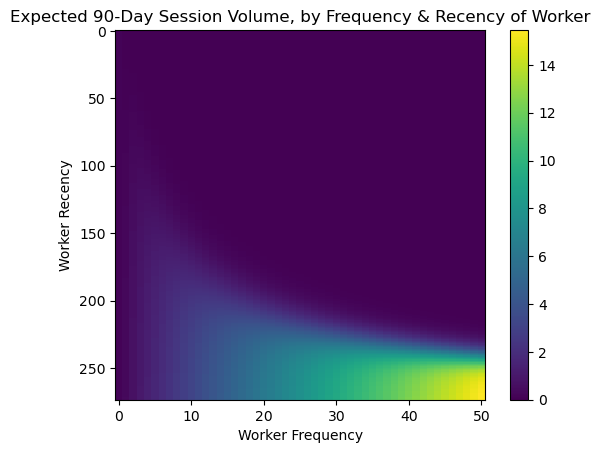

In [25]:
plot_frequency_recency_matrix(model, T=90, title="Expected 90-Day Session Volume, by Frequency & Recency of Worker", xlabel="Worker Frequency", ylabel="Worker Recency")

plt.show()

The chart illustrates the expected 90-day session volume based on worker frequency and recency. The x-axis represents worker frequency, ranging from 0 to 50, while the y-axis indicates worker recency, or the age of the worker on the platform at the time of their session. The expected session volume is shown through a color gradient, with dark blue indicating the lowest values (around 0 sessions) and yellow representing the highest values (up to about 16 sessions).

The highest session volumes occur when both frequency and recency are high, visible in the bottom-right corner of the chart. This suggests a correlation between these two factors: workers who have participated often and have a longer-standing presence on the platform are far more likely to contribute significant session volume in the coming 90 days. 

There is also a notable threshold effect on the recency scale. Once recency values cross the 200–250 range, session volume tends to increase dramatically, even for workers with moderate frequency. This indicates that re-engagement through the first 6-8 months of workers' time on the platform plays a critical role in retention.

### Probability "Alive", based on Worker Frequency and Recency



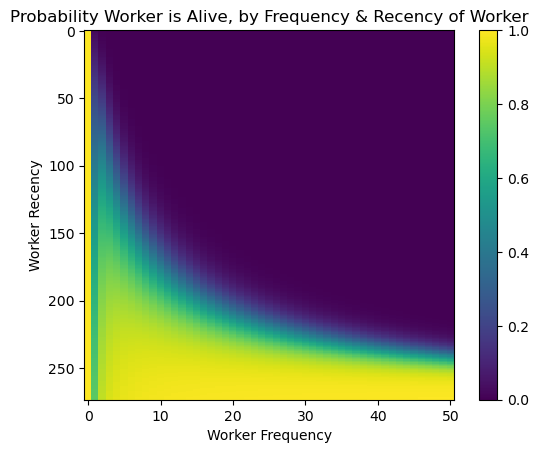

In [26]:
plot_probability_alive_matrix(model, title="Probability Worker is Alive, by Frequency & Recency of Worker", xlabel="Worker Frequency", ylabel="Worker Recency")
plt.show()

The chart examines the probability of a worker still being "alive," or actively engaged, based on their historical session frequency and the recency of their last session. The x-axis represents a customer's historical frequency, indicating session volume, with values increasing from left to right. The y-axis shows recency, or the age of the worker at the time of their session, increasing from top to bottom.

This chart reinforces the strength of long-standing, high-frequency workers, as seen in the bottom right corner. The model appears confident that users who have completed more than five sessions and have been on the platform for over 250 days are still active. In contrast, it shows much less confidence – assigning a probability of being active between 40% and 60% – for users with ten or fewer sessions who have not been on the platform for more than 150 days. This may help explain the pattern observed in the expected session volume chart discussed earlier, as the model does not expect many of these users to return until they approach the 200-day recency threshold. Overall, the chart supports our earlier conclusion that strong engagement during a worker’s first few months on the platform is critical for long-term retention.